In [67]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from tabulate import tabulate
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.neural_network import MLPClassifier

In [27]:
def first_ds():
    # Import the dataset
    dataset = pd.read_csv('PI-CAI_features')
    labels = pd.read_csv('PI-CAI_labels')

    # Filter the dataset to include only AI annotations and t2w sequences
    filtered_dataset = dataset[dataset['annotator'] == 'AI']
    filtered_dataset = filtered_dataset[filtered_dataset['sequence'] == 't2w']
    filtered_dataset.drop(columns=['annotator', 'sequence', 'ROI_ID', 'ROI', 'img_path', 'seg_path', 'extraction_ID'], inplace=True)
    dataset = filtered_dataset

    # Rename columns to match the labels dataset
    labels.rename(columns={'patient_id': 'patient_ID', 'study_id': 'study_ID'}, inplace=True)

    # We only want Magnetic Resonace Biopsy (MRBx) labels because Systematic Biopsy (SBx) labels are not for our usecase
    # we also remove those that have both because clicinians result might be biased
    labels = labels[labels['histopath_type'] == 'MRBx']

    # Remove useless columns from labels dataset
    labels.drop(columns=['mri_date', 'histopath_type'], inplace=True)

    # Merge the datasets on patient_ID and study_ID
    dataset = pd.merge(dataset, labels, on=['patient_ID', 'study_ID'])
    dataset.drop(columns=['patient_ID', 'study_ID'], inplace=True)
    return dataset

dataset = first_ds()
dataset


,original_shape_Elongation,original_shape_Flatness,original_shape_LeastAxisLength,original_shape_MajorAxisLength,original_shape_Maximum2DDiameterColumn,original_shape_Maximum2DDiameterRow,original_shape_Maximum2DDiameterSlice,original_shape_Maximum3DDiameter,original_shape_MeshVolume,original_shape_MinorAxisLength,...,wavelet-LLL_ngtdm_Busyness,wavelet-LLL_ngtdm_Coarseness,wavelet-LLL_ngtdm_Complexity,wavelet-LLL_ngtdm_Contrast,wavelet-LLL_ngtdm_Strength,patient_age,psa,psad,prostate_volume,lesion_GS
0,0.812998,0.639631,29.422334,45.998925,50.970678,45.300772,51.419841,51.594670,35351.249489,37.397021,...,0.026315,0.004833,54147.400635,0.453474,33.715674,73,7.7,NaN,55.0,0+0
1,0.814941,0.751836,38.406257,51.083263,58.694122,50.089919,59.665736,59.741108,56510.500000,41.629869,...,0.031220,0.002777,136360.081260,0.957174,33.466621,64,12.1,0.24,51.0,"4+3,0+0"
2,0.810849,0.536311,5.872887,10.950534,12.649111,12.649111,10.770330,13.266499,351.500000,8.879226,...,0.018964,0.070063,10438.406119,13.802616,153.749674,64,12.1,0.24,51.0,"4+3,0+0"
3,0.785397,0.658577,29.105212,44.194108,48.662100,55.542776,42.426407,55.686623,30066.500000,34.709925,...,0.042593,0.004703,27711.939068,0.429777,17.196472,60,7.1,NaN,34.0,"3+3,0+0"
4,0.944758,0.733984,39.755870,54.164509,61.098281,59.933296,57.688820,61.911227,74476.500000,51.172356,...,0.087866,0.001784,53157.054745,0.258861,18.400733,64,9.9,0.14,70.0,3+4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
786,0.861388,0.818372,10.240434,12.513179,13.200379,14.500000,14.142136,15.041609,935.083333,10.778701,...,0.014249,0.078813,3205.789480,1.172376,51.808132,71,12.5,0.21,62.0,"3+4,N/A,3+3"
787,0.897570,0.733925,38.981358,53.113555,55.887029,64.344074,56.035703,64.839493,70807.798124,47.673142,...,0.039496,0.002213,88720.568998,0.229545,36.489983,56,29.6,0.34,87.0,0+0
788,0.962385,0.848807,43.103578,50.781365,59.093146,59.933295,60.033324,61.220910,73925.998042,48.871213,...,0.061012,0.002160,50300.490342,0.358784,13.596366,71,12.0,NaN,83.0,3+3
789,0.716594,0.602086,25.575193,42.477649,48.093659,37.589892,48.662100,48.754487,23212.500000,30.439244,...,0.039133,0.007182,16991.217824,0.337861,21.233305,56,15.0,0.46,33.0,4+5


In [28]:
missing_values = dataset.isnull().sum()
c = 0
for column, count in missing_values.items():
    if count > 0:
        print(f"{column}: {count} missing values")
        c += 1
if c == 0:
    print("No missing values found in the dataset.")


psa: 15 missing values
psad: 310 missing values
prostate_volume: 16 missing values


In [29]:
def second_ds(print_info=False):
    dataset = first_ds()
    # Remove all rows with missing values
    dataset.dropna(inplace=True)
    missing_values = dataset.isnull().sum()
    c = 0
    for column, count in missing_values.items():
        if count > 0:
            print(f"{column}: {count} missing values")
            c += 1
    if c == 0:
        if print_info:  print("No missing values found in the dataset.")
    # Check for duplicates
    duplicates = dataset.duplicated().sum()
    if duplicates > 0:
        if print_info: print(f"Found {duplicates} duplicate rows in the dataset.")
        #dataset.drop_duplicates(inplace=True)
    else:
        if print_info : print("No duplicate rows found in the dataset.")
    
    return dataset

dataset = second_ds()
dataset

,original_shape_Elongation,original_shape_Flatness,original_shape_LeastAxisLength,original_shape_MajorAxisLength,original_shape_Maximum2DDiameterColumn,original_shape_Maximum2DDiameterRow,original_shape_Maximum2DDiameterSlice,original_shape_Maximum3DDiameter,original_shape_MeshVolume,original_shape_MinorAxisLength,...,wavelet-LLL_ngtdm_Busyness,wavelet-LLL_ngtdm_Coarseness,wavelet-LLL_ngtdm_Complexity,wavelet-LLL_ngtdm_Contrast,wavelet-LLL_ngtdm_Strength,patient_age,psa,psad,prostate_volume,lesion_GS
1,0.814941,0.751836,38.406257,51.083263,58.694122,50.089919,59.665736,59.741108,56510.500000,41.629869,...,0.031220,0.002777,136360.081260,0.957174,33.466621,64,12.1,0.24,51.0,"4+3,0+0"
2,0.810849,0.536311,5.872887,10.950534,12.649111,12.649111,10.770330,13.266499,351.500000,8.879226,...,0.018964,0.070063,10438.406119,13.802616,153.749674,64,12.1,0.24,51.0,"4+3,0+0"
4,0.944758,0.733984,39.755870,54.164509,61.098281,59.933296,57.688820,61.911227,74476.500000,51.172356,...,0.087866,0.001784,53157.054745,0.258861,18.400733,64,9.9,0.14,70.0,3+4
5,0.561657,0.342182,6.991918,20.433342,15.620499,20.124612,15.231546,21.000000,1004.500000,11.476528,...,0.024734,0.060099,3668.173061,0.981707,38.704456,64,9.9,0.14,70.0,3+4
8,0.857694,0.705555,30.951719,43.868613,47.539457,45.607017,47.413078,50.279220,36096.500000,37.625862,...,0.046018,0.003944,33850.817173,0.300104,21.383606,61,10.0,0.24,42.0,"N/A,N/A,N/A,3+4"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
785,0.887008,0.748482,36.486575,48.747408,58.105507,51.613952,59.228372,59.331695,51419.666667,43.239318,...,0.043169,0.003001,66317.618769,0.544912,20.205571,71,12.5,0.21,62.0,"3+4,N/A,3+3"
786,0.861388,0.818372,10.240434,12.513179,13.200379,14.500000,14.142136,15.041609,935.083333,10.778701,...,0.014249,0.078813,3205.789480,1.172376,51.808132,71,12.5,0.21,62.0,"3+4,N/A,3+3"
787,0.897570,0.733925,38.981358,53.113555,55.887029,64.344074,56.035703,64.839493,70807.798124,47.673142,...,0.039496,0.002213,88720.568998,0.229545,36.489983,56,29.6,0.34,87.0,0+0
789,0.716594,0.602086,25.575193,42.477649,48.093659,37.589892,48.662100,48.754487,23212.500000,30.439244,...,0.039133,0.007182,16991.217824,0.337861,21.233305,56,15.0,0.46,33.0,4+5


In [30]:
def reset():
    return second_ds()

dataset = reset()

In [31]:
# TO DO: Check for zero values

In [32]:
print(tabulate(dataset, headers='keys', tablefmt='psql'))

+-----+-----------------------------+---------------------------+----------------------------------+----------------------------------+------------------------------------------+---------------------------------------+-----------------------------------------+------------------------------------+-----------------------------+----------------------------------+-----------------------------+------------------------------+-------------------------------------+------------------------------+------------------------------------+------------------------------------+------------------------------+-------------------------------+------------------------------------------+--------------------------------+-------------------------------+---------------------------------------------+----------------------------+------------------------------+-------------------------------+-----------------------------+---------------------------------------------------+---------------------------------------+---

In [33]:
reduced = dataset.drop(columns=['lesion_GS'])
correlation_matrix = reduced.corr()


In [34]:
corr_matrix = correlation_matrix.abs()

upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))


to_drop = [column for column in upper.columns if any(upper[column] > 0.90)]

# Drop features 
dataset = reset()
dataset.drop(to_drop, axis=1, inplace=True)
print(dataset.columns.tolist())

['original_shape_Elongation', 'original_shape_Flatness', 'original_shape_LeastAxisLength', 'original_shape_Sphericity', 'original_shape_SurfaceVolumeRatio', 'original_firstorder_10Percentile', 'original_firstorder_90Percentile', 'original_firstorder_Entropy', 'original_firstorder_InterquartileRange', 'original_firstorder_Kurtosis', 'original_firstorder_Maximum', 'original_firstorder_Minimum', 'original_firstorder_Skewness', 'original_glcm_Autocorrelation', 'original_glcm_ClusterProminence', 'original_glcm_Contrast', 'original_glcm_Correlation', 'original_glcm_JointEnergy', 'original_glcm_Imc2', 'original_glcm_Idmn', 'original_glrlm_LongRunEmphasis', 'original_glrlm_LongRunLowGrayLevelEmphasis', 'original_glszm_LargeAreaEmphasis', 'original_glszm_LargeAreaHighGrayLevelEmphasis', 'original_glszm_LargeAreaLowGrayLevelEmphasis', 'original_glszm_SizeZoneNonUniformityNormalized', 'original_gldm_LargeDependenceLowGrayLevelEmphasis', 'original_ngtdm_Contrast', 'original_ngtdm_Strength', 'log-s

In [37]:
to_keep_90 = ['original_shape_Elongation', 'original_shape_Flatness', 'original_shape_LeastAxisLength', 'original_shape_MajorAxisLength', 'original_shape_Sphericity', 'original_shape_SurfaceVolumeRatio', 'original_firstorder_10Percentile', 'original_firstorder_90Percentile', 'original_firstorder_Entropy', 'original_firstorder_InterquartileRange', 'original_firstorder_Kurtosis', 'original_firstorder_Maximum', 'original_firstorder_Minimum', 'original_firstorder_Skewness', 'original_glcm_Autocorrelation', 'original_glcm_ClusterProminence', 'original_glcm_Contrast', 'original_glcm_Correlation', 'original_glcm_JointEnergy', 'original_glcm_Imc2', 'original_glcm_Idm', 'original_glcm_Idmn', 'original_glrlm_LongRunEmphasis', 'original_glrlm_LongRunLowGrayLevelEmphasis', 'original_glszm_LargeAreaEmphasis', 'original_glszm_LargeAreaHighGrayLevelEmphasis', 'original_glszm_LargeAreaLowGrayLevelEmphasis', 'original_glszm_SizeZoneNonUniformityNormalized', 'original_gldm_LargeDependenceLowGrayLevelEmphasis', 'original_ngtdm_Contrast', 'original_ngtdm_Strength', 'log-sigma-3-0-mm-3D_firstorder_10Percentile', 'log-sigma-3-0-mm-3D_firstorder_90Percentile', 'log-sigma-3-0-mm-3D_firstorder_InterquartileRange', 'log-sigma-3-0-mm-3D_firstorder_Kurtosis', 'log-sigma-3-0-mm-3D_firstorder_Maximum', 'log-sigma-3-0-mm-3D_firstorder_Mean', 'log-sigma-3-0-mm-3D_firstorder_Minimum', 'log-sigma-3-0-mm-3D_firstorder_Skewness', 'log-sigma-3-0-mm-3D_glcm_ClusterProminence', 'log-sigma-3-0-mm-3D_glcm_ClusterShade', 'log-sigma-3-0-mm-3D_glcm_Contrast', 'log-sigma-3-0-mm-3D_glcm_Correlation', 'log-sigma-3-0-mm-3D_glcm_Imc2', 'log-sigma-3-0-mm-3D_glcm_Idmn', 'log-sigma-3-0-mm-3D_glrlm_LongRunEmphasis', 'log-sigma-3-0-mm-3D_glrlm_LongRunLowGrayLevelEmphasis', 'log-sigma-3-0-mm-3D_glszm_LargeAreaEmphasis', 'log-sigma-3-0-mm-3D_glszm_LargeAreaHighGrayLevelEmphasis', 'log-sigma-3-0-mm-3D_glszm_LargeAreaLowGrayLevelEmphasis', 'log-sigma-3-0-mm-3D_glszm_SizeZoneNonUniformityNormalized', 'log-sigma-3-0-mm-3D_gldm_LargeDependenceLowGrayLevelEmphasis', 'log-sigma-3-0-mm-3D_ngtdm_Busyness', 'log-sigma-3-0-mm-3D_ngtdm_Contrast', 'log-sigma-3-0-mm-3D_ngtdm_Strength', 'log-sigma-5-0-mm-3D_firstorder_90Percentile', 'log-sigma-5-0-mm-3D_firstorder_InterquartileRange', 'log-sigma-5-0-mm-3D_firstorder_Kurtosis', 'log-sigma-5-0-mm-3D_firstorder_Maximum', 'log-sigma-5-0-mm-3D_firstorder_Mean', 'log-sigma-5-0-mm-3D_firstorder_Minimum', 'log-sigma-5-0-mm-3D_firstorder_Skewness', 'log-sigma-5-0-mm-3D_glcm_ClusterShade', 'log-sigma-5-0-mm-3D_glcm_Contrast', 'log-sigma-5-0-mm-3D_glcm_Correlation', 'log-sigma-5-0-mm-3D_glcm_DifferenceVariance', 'log-sigma-5-0-mm-3D_glcm_Imc2', 'log-sigma-5-0-mm-3D_glrlm_LongRunEmphasis', 'log-sigma-5-0-mm-3D_glrlm_LongRunLowGrayLevelEmphasis', 'log-sigma-5-0-mm-3D_glszm_LargeAreaEmphasis', 'log-sigma-5-0-mm-3D_glszm_LargeAreaHighGrayLevelEmphasis', 'log-sigma-5-0-mm-3D_glszm_LargeAreaLowGrayLevelEmphasis', 'log-sigma-5-0-mm-3D_glszm_SizeZoneNonUniformityNormalized', 'log-sigma-5-0-mm-3D_glszm_SmallAreaEmphasis', 'log-sigma-5-0-mm-3D_glszm_SmallAreaLowGrayLevelEmphasis', 'log-sigma-5-0-mm-3D_glszm_ZonePercentage', 'log-sigma-5-0-mm-3D_gldm_LargeDependenceLowGrayLevelEmphasis', 'log-sigma-5-0-mm-3D_ngtdm_Busyness', 'log-sigma-5-0-mm-3D_ngtdm_Contrast', 'log-sigma-5-0-mm-3D_ngtdm_Strength', 'wavelet-LLH_firstorder_10Percentile', 'wavelet-LLH_firstorder_90Percentile', 'wavelet-LLH_firstorder_InterquartileRange', 'wavelet-LLH_firstorder_Kurtosis', 'wavelet-LLH_firstorder_Maximum', 'wavelet-LLH_firstorder_Mean', 'wavelet-LLH_firstorder_Median', 'wavelet-LLH_firstorder_Minimum', 'wavelet-LLH_firstorder_RootMeanSquared', 'wavelet-LLH_firstorder_Skewness', 'wavelet-LLH_firstorder_Variance', 'wavelet-LLH_glcm_ClusterProminence', 'wavelet-LLH_glcm_Correlation', 'wavelet-LLH_glcm_DifferenceVariance', 'wavelet-LLH_glcm_Imc2', 'wavelet-LLH_glcm_Idm', 'wavelet-LLH_glcm_Idmn', 'wavelet-LLH_glrlm_LongRunEmphasis', 'wavelet-LLH_glrlm_LongRunLowGrayLevelEmphasis', 'wavelet-LLH_glszm_LargeAreaEmphasis', 'wavelet-LLH_glszm_LargeAreaHighGrayLevelEmphasis', 'wavelet-LLH_glszm_LargeAreaLowGrayLevelEmphasis', 'wavelet-LLH_glszm_SizeZoneNonUniformityNormalized', 'wavelet-LLH_gldm_LargeDependenceLowGrayLevelEmphasis', 'wavelet-LLH_ngtdm_Busyness', 'wavelet-LLH_ngtdm_Contrast', 'wavelet-LLH_ngtdm_Strength', 'wavelet-LHL_firstorder_10Percentile', 'wavelet-LHL_firstorder_90Percentile', 'wavelet-LHL_firstorder_Entropy', 'wavelet-LHL_firstorder_InterquartileRange', 'wavelet-LHL_firstorder_Kurtosis', 'wavelet-LHL_firstorder_Maximum', 'wavelet-LHL_firstorder_Mean', 'wavelet-LHL_firstorder_Median', 'wavelet-LHL_firstorder_Minimum', 'wavelet-LHL_firstorder_RootMeanSquared', 'wavelet-LHL_firstorder_Skewness', 'wavelet-LHL_glcm_ClusterProminence', 'wavelet-LHL_glcm_ClusterShade', 'wavelet-LHL_glcm_Correlation', 'wavelet-LHL_glcm_Imc2', 'wavelet-LHL_glcm_Idm', 'wavelet-LHL_glrlm_LongRunEmphasis', 'wavelet-LHL_glszm_LargeAreaEmphasis', 'wavelet-LHL_glszm_LargeAreaHighGrayLevelEmphasis', 'wavelet-LHL_glszm_LargeAreaLowGrayLevelEmphasis', 'wavelet-LHL_glszm_SizeZoneNonUniformityNormalized', 'wavelet-LHL_gldm_LargeDependenceLowGrayLevelEmphasis', 'wavelet-LHL_ngtdm_Busyness', 'wavelet-LHL_ngtdm_Complexity', 'wavelet-LHL_ngtdm_Contrast', 'wavelet-LHL_ngtdm_Strength', 'wavelet-LHH_firstorder_10Percentile', 'wavelet-LHH_firstorder_90Percentile', 'wavelet-LHH_firstorder_Entropy', 'wavelet-LHH_firstorder_Kurtosis', 'wavelet-LHH_firstorder_Maximum', 'wavelet-LHH_firstorder_Mean', 'wavelet-LHH_firstorder_Median', 'wavelet-LHH_firstorder_Minimum', 'wavelet-LHH_firstorder_RootMeanSquared', 'wavelet-LHH_firstorder_Skewness', 'wavelet-LHH_glcm_ClusterProminence', 'wavelet-LHH_glcm_Correlation', 'wavelet-LHH_glcm_Idm', 'wavelet-LHH_glrlm_LongRunEmphasis', 'wavelet-LHH_glrlm_LongRunLowGrayLevelEmphasis', 'wavelet-LHH_glszm_LargeAreaEmphasis', 'wavelet-LHH_glszm_LargeAreaHighGrayLevelEmphasis', 'wavelet-LHH_glszm_LargeAreaLowGrayLevelEmphasis', 'wavelet-LHH_glszm_SizeZoneNonUniformityNormalized', 'wavelet-LHH_gldm_LargeDependenceLowGrayLevelEmphasis', 'wavelet-LHH_ngtdm_Busyness', 'wavelet-LHH_ngtdm_Contrast', 'wavelet-LHH_ngtdm_Strength', 'wavelet-HLL_firstorder_10Percentile', 'wavelet-HLL_firstorder_90Percentile', 'wavelet-HLL_firstorder_InterquartileRange', 'wavelet-HLL_firstorder_Kurtosis', 'wavelet-HLL_firstorder_Maximum', 'wavelet-HLL_firstorder_Mean', 'wavelet-HLL_firstorder_Median', 'wavelet-HLL_firstorder_Minimum', 'wavelet-HLL_firstorder_Skewness', 'wavelet-HLL_glcm_ClusterProminence', 'wavelet-HLL_glcm_ClusterShade', 'wavelet-HLL_glcm_Correlation', 'wavelet-HLL_glcm_Idm', 'wavelet-HLL_glcm_Idmn', 'wavelet-HLL_glrlm_LongRunEmphasis', 'wavelet-HLL_glszm_LargeAreaHighGrayLevelEmphasis', 'wavelet-HLL_glszm_LargeAreaLowGrayLevelEmphasis', 'wavelet-HLL_glszm_SizeZoneNonUniformityNormalized', 'wavelet-HLL_gldm_LargeDependenceLowGrayLevelEmphasis', 'wavelet-HLL_ngtdm_Busyness', 'wavelet-HLL_ngtdm_Contrast', 'wavelet-HLL_ngtdm_Strength', 'wavelet-HLH_firstorder_10Percentile', 'wavelet-HLH_firstorder_90Percentile', 'wavelet-HLH_firstorder_Entropy', 'wavelet-HLH_firstorder_Kurtosis', 'wavelet-HLH_firstorder_Maximum', 'wavelet-HLH_firstorder_Mean', 'wavelet-HLH_firstorder_Median', 'wavelet-HLH_firstorder_Minimum', 'wavelet-HLH_firstorder_RootMeanSquared', 'wavelet-HLH_firstorder_Skewness', 'wavelet-HLH_glcm_ClusterProminence', 'wavelet-HLH_glcm_Correlation', 'wavelet-HLH_glcm_Idm', 'wavelet-HLH_glrlm_LongRunLowGrayLevelEmphasis', 'wavelet-HLH_glszm_LargeAreaEmphasis', 'wavelet-HLH_glszm_LargeAreaHighGrayLevelEmphasis', 'wavelet-HLH_glszm_LargeAreaLowGrayLevelEmphasis', 'wavelet-HLH_glszm_SizeZoneNonUniformityNormalized', 'wavelet-HLH_gldm_LargeDependenceLowGrayLevelEmphasis', 'wavelet-HLH_ngtdm_Busyness', 'wavelet-HLH_ngtdm_Complexity', 'wavelet-HLH_ngtdm_Strength', 'wavelet-HHL_firstorder_10Percentile', 'wavelet-HHL_firstorder_90Percentile', 'wavelet-HHL_firstorder_InterquartileRange', 'wavelet-HHL_firstorder_Kurtosis', 'wavelet-HHL_firstorder_Maximum', 'wavelet-HHL_firstorder_Mean', 'wavelet-HHL_firstorder_Median', 'wavelet-HHL_firstorder_Minimum', 'wavelet-HHL_firstorder_RootMeanSquared', 'wavelet-HHL_firstorder_Skewness', 'wavelet-HHL_glcm_ClusterProminence', 'wavelet-HHL_glcm_ClusterShade', 'wavelet-HHL_glcm_Correlation', 'wavelet-HHL_glcm_Idm', 'wavelet-HHL_glrlm_LongRunEmphasis', 'wavelet-HHL_glrlm_LongRunLowGrayLevelEmphasis', 'wavelet-HHL_glszm_LargeAreaHighGrayLevelEmphasis', 'wavelet-HHL_glszm_LargeAreaLowGrayLevelEmphasis', 'wavelet-HHL_glszm_SizeZoneNonUniformityNormalized', 'wavelet-HHL_gldm_LargeDependenceLowGrayLevelEmphasis', 'wavelet-HHL_ngtdm_Busyness', 'wavelet-HHL_ngtdm_Contrast', 'wavelet-HHL_ngtdm_Strength', 'wavelet-HHH_firstorder_10Percentile', 'wavelet-HHH_firstorder_Kurtosis', 'wavelet-HHH_firstorder_Maximum', 'wavelet-HHH_firstorder_Mean', 'wavelet-HHH_firstorder_Median', 'wavelet-HHH_firstorder_Minimum', 'wavelet-HHH_firstorder_RootMeanSquared', 'wavelet-HHH_firstorder_Skewness', 'wavelet-HHH_glcm_ClusterProminence', 'wavelet-HHH_glcm_ClusterShade', 'wavelet-HHH_glcm_Correlation', 'wavelet-HHH_glcm_Idm', 'wavelet-HHH_glrlm_LongRunLowGrayLevelEmphasis', 'wavelet-HHH_glszm_LargeAreaHighGrayLevelEmphasis', 'wavelet-HHH_glszm_LargeAreaLowGrayLevelEmphasis', 'wavelet-HHH_glszm_SizeZoneNonUniformityNormalized', 'wavelet-HHH_gldm_LargeDependenceLowGrayLevelEmphasis', 'wavelet-HHH_ngtdm_Busyness', 'wavelet-HHH_ngtdm_Contrast', 'wavelet-HHH_ngtdm_Strength', 'wavelet-LLL_firstorder_Kurtosis', 'wavelet-LLL_firstorder_Skewness', 'wavelet-LLL_glcm_Idm', 'wavelet-LLL_glszm_LargeAreaEmphasis', 'wavelet-LLL_glszm_SizeZoneNonUniformityNormalized', 'wavelet-LLL_ngtdm_Busyness', 'wavelet-LLL_ngtdm_Contrast', 'wavelet-LLL_ngtdm_Strength', 'patient_age', 'psa', 'psad', 'prostate_volume', 'lesion_GS']
to_keep_85 = ['original_shape_Elongation', 'original_shape_Flatness', 'original_shape_LeastAxisLength', 'original_shape_Sphericity', 'original_firstorder_10Percentile', 'original_firstorder_90Percentile', 'original_firstorder_Kurtosis', 'original_firstorder_Minimum', 'original_firstorder_Skewness', 'original_glcm_ClusterProminence', 'original_glcm_Contrast', 'original_glcm_JointEnergy', 'original_glcm_Imc2', 'original_glrlm_LongRunEmphasis', 'original_glrlm_LongRunLowGrayLevelEmphasis', 'original_glszm_LargeAreaEmphasis', 'original_glszm_LargeAreaHighGrayLevelEmphasis', 'original_glszm_LargeAreaLowGrayLevelEmphasis', 'original_glszm_SizeZoneNonUniformityNormalized', 'original_gldm_LargeDependenceLowGrayLevelEmphasis', 'original_ngtdm_Contrast', 'original_ngtdm_Strength', 'log-sigma-3-0-mm-3D_firstorder_90Percentile', 'log-sigma-3-0-mm-3D_firstorder_Kurtosis', 'log-sigma-3-0-mm-3D_firstorder_Maximum', 'log-sigma-3-0-mm-3D_firstorder_Mean', 'log-sigma-3-0-mm-3D_firstorder_Skewness', 'log-sigma-3-0-mm-3D_glcm_Contrast', 'log-sigma-3-0-mm-3D_glcm_Imc2', 'log-sigma-3-0-mm-3D_glrlm_LongRunEmphasis', 'log-sigma-3-0-mm-3D_glszm_LargeAreaEmphasis', 'log-sigma-3-0-mm-3D_glszm_LargeAreaHighGrayLevelEmphasis', 'log-sigma-3-0-mm-3D_glszm_LargeAreaLowGrayLevelEmphasis', 'log-sigma-3-0-mm-3D_glszm_SizeZoneNonUniformityNormalized', 'log-sigma-3-0-mm-3D_gldm_LargeDependenceLowGrayLevelEmphasis', 'log-sigma-3-0-mm-3D_ngtdm_Busyness', 'log-sigma-3-0-mm-3D_ngtdm_Contrast', 'log-sigma-3-0-mm-3D_ngtdm_Strength', 'log-sigma-5-0-mm-3D_firstorder_90Percentile', 'log-sigma-5-0-mm-3D_firstorder_Kurtosis', 'log-sigma-5-0-mm-3D_firstorder_Mean', 'log-sigma-5-0-mm-3D_firstorder_Skewness', 'log-sigma-5-0-mm-3D_glcm_ClusterShade', 'log-sigma-5-0-mm-3D_glcm_Contrast', 'log-sigma-5-0-mm-3D_glcm_Imc2', 'log-sigma-5-0-mm-3D_glrlm_LongRunEmphasis', 'log-sigma-5-0-mm-3D_glrlm_LongRunLowGrayLevelEmphasis', 'log-sigma-5-0-mm-3D_glszm_LargeAreaHighGrayLevelEmphasis', 'log-sigma-5-0-mm-3D_glszm_LargeAreaLowGrayLevelEmphasis', 'log-sigma-5-0-mm-3D_glszm_SizeZoneNonUniformityNormalized', 'log-sigma-5-0-mm-3D_glszm_SmallAreaEmphasis', 'log-sigma-5-0-mm-3D_gldm_LargeDependenceLowGrayLevelEmphasis', 'log-sigma-5-0-mm-3D_ngtdm_Busyness', 'log-sigma-5-0-mm-3D_ngtdm_Contrast', 'log-sigma-5-0-mm-3D_ngtdm_Strength', 'wavelet-LLH_firstorder_10Percentile', 'wavelet-LLH_firstorder_90Percentile', 'wavelet-LLH_firstorder_InterquartileRange', 'wavelet-LLH_firstorder_Kurtosis', 'wavelet-LLH_firstorder_Maximum', 'wavelet-LLH_firstorder_Mean', 'wavelet-LLH_firstorder_Minimum', 'wavelet-LLH_firstorder_Skewness', 'wavelet-LLH_glcm_ClusterProminence', 'wavelet-LLH_glcm_Correlation', 'wavelet-LLH_glcm_Idm', 'wavelet-LLH_glszm_LargeAreaHighGrayLevelEmphasis', 'wavelet-LLH_glszm_LargeAreaLowGrayLevelEmphasis', 'wavelet-LLH_glszm_SizeZoneNonUniformityNormalized', 'wavelet-LLH_gldm_LargeDependenceLowGrayLevelEmphasis', 'wavelet-LLH_ngtdm_Busyness', 'wavelet-LLH_ngtdm_Contrast', 'wavelet-LLH_ngtdm_Strength', 'wavelet-LHL_firstorder_10Percentile', 'wavelet-LHL_firstorder_90Percentile', 'wavelet-LHL_firstorder_Kurtosis', 'wavelet-LHL_firstorder_Maximum', 'wavelet-LHL_firstorder_Mean', 'wavelet-LHL_firstorder_Median', 'wavelet-LHL_firstorder_Minimum', 'wavelet-LHL_firstorder_RootMeanSquared', 'wavelet-LHL_firstorder_Skewness', 'wavelet-LHL_glcm_ClusterShade', 'wavelet-LHL_glcm_Correlation', 'wavelet-LHL_glcm_Idm', 'wavelet-LHL_glrlm_LongRunEmphasis', 'wavelet-LHL_glszm_LargeAreaEmphasis', 'wavelet-LHL_glszm_LargeAreaHighGrayLevelEmphasis', 'wavelet-LHL_glszm_LargeAreaLowGrayLevelEmphasis', 'wavelet-LHL_glszm_SizeZoneNonUniformityNormalized', 'wavelet-LHL_gldm_LargeDependenceLowGrayLevelEmphasis', 'wavelet-LHL_ngtdm_Busyness', 'wavelet-LHL_ngtdm_Contrast', 'wavelet-LHL_ngtdm_Strength', 'wavelet-LHH_firstorder_10Percentile', 'wavelet-LHH_firstorder_90Percentile', 'wavelet-LHH_firstorder_Kurtosis', 'wavelet-LHH_firstorder_Maximum', 'wavelet-LHH_firstorder_Mean', 'wavelet-LHH_firstorder_Median', 'wavelet-LHH_firstorder_Skewness', 'wavelet-LHH_glcm_ClusterProminence', 'wavelet-LHH_glszm_LargeAreaEmphasis', 'wavelet-LHH_glszm_LargeAreaHighGrayLevelEmphasis', 'wavelet-LHH_glszm_LargeAreaLowGrayLevelEmphasis', 'wavelet-LHH_glszm_SizeZoneNonUniformityNormalized', 'wavelet-LHH_gldm_LargeDependenceLowGrayLevelEmphasis', 'wavelet-LHH_ngtdm_Busyness', 'wavelet-LHH_ngtdm_Contrast', 'wavelet-LHH_ngtdm_Strength', 'wavelet-HLL_firstorder_10Percentile', 'wavelet-HLL_firstorder_90Percentile', 'wavelet-HLL_firstorder_Kurtosis', 'wavelet-HLL_firstorder_Maximum', 'wavelet-HLL_firstorder_Mean', 'wavelet-HLL_firstorder_Minimum', 'wavelet-HLL_firstorder_Skewness', 'wavelet-HLL_glcm_ClusterProminence', 'wavelet-HLL_glcm_ClusterShade', 'wavelet-HLL_glcm_Correlation', 'wavelet-HLL_glrlm_LongRunEmphasis', 'wavelet-HLL_glszm_LargeAreaHighGrayLevelEmphasis', 'wavelet-HLL_glszm_LargeAreaLowGrayLevelEmphasis', 'wavelet-HLL_glszm_SizeZoneNonUniformityNormalized', 'wavelet-HLL_ngtdm_Busyness', 'wavelet-HLL_ngtdm_Contrast', 'wavelet-HLL_ngtdm_Strength', 'wavelet-HLH_firstorder_10Percentile', 'wavelet-HLH_firstorder_90Percentile', 'wavelet-HLH_firstorder_Kurtosis', 'wavelet-HLH_firstorder_Maximum', 'wavelet-HLH_firstorder_Mean', 'wavelet-HLH_firstorder_Median', 'wavelet-HLH_firstorder_Minimum', 'wavelet-HLH_firstorder_RootMeanSquared', 'wavelet-HLH_firstorder_Skewness', 'wavelet-HLH_glcm_Idm', 'wavelet-HLH_glszm_LargeAreaHighGrayLevelEmphasis', 'wavelet-HLH_glszm_LargeAreaLowGrayLevelEmphasis', 'wavelet-HLH_glszm_SizeZoneNonUniformityNormalized', 'wavelet-HLH_ngtdm_Busyness', 'wavelet-HLH_ngtdm_Strength', 'wavelet-HHL_firstorder_10Percentile', 'wavelet-HHL_firstorder_Kurtosis', 'wavelet-HHL_firstorder_Maximum', 'wavelet-HHL_firstorder_Mean', 'wavelet-HHL_firstorder_Median', 'wavelet-HHL_firstorder_Minimum', 'wavelet-HHL_firstorder_RootMeanSquared', 'wavelet-HHL_firstorder_Skewness', 'wavelet-HHL_glcm_ClusterShade', 'wavelet-HHL_glcm_Correlation', 'wavelet-HHL_glszm_LargeAreaHighGrayLevelEmphasis', 'wavelet-HHL_glszm_LargeAreaLowGrayLevelEmphasis', 'wavelet-HHL_glszm_SizeZoneNonUniformityNormalized', 'wavelet-HHL_gldm_LargeDependenceLowGrayLevelEmphasis', 'wavelet-HHL_ngtdm_Busyness', 'wavelet-HHL_ngtdm_Contrast', 'wavelet-HHH_firstorder_10Percentile', 'wavelet-HHH_firstorder_Kurtosis', 'wavelet-HHH_firstorder_Maximum', 'wavelet-HHH_firstorder_Mean', 'wavelet-HHH_firstorder_Median', 'wavelet-HHH_firstorder_RootMeanSquared', 'wavelet-HHH_firstorder_Skewness', 'wavelet-HHH_glcm_ClusterShade', 'wavelet-HHH_glcm_Correlation', 'wavelet-HHH_glrlm_LongRunLowGrayLevelEmphasis', 'wavelet-HHH_glszm_LargeAreaLowGrayLevelEmphasis', 'wavelet-HHH_glszm_SizeZoneNonUniformityNormalized', 'wavelet-HHH_gldm_LargeDependenceLowGrayLevelEmphasis', 'wavelet-LLL_firstorder_Kurtosis', 'wavelet-LLL_firstorder_Skewness', 'wavelet-LLL_ngtdm_Busyness', 'wavelet-LLL_ngtdm_Contrast', 'patient_age', 'psa', 'psad', 'prostate_volume', 'lesion_GS']

len(to_keep_90), len(to_keep_85)

(256, 180)

In [38]:
def r_reset(corr_threshold_90=True):
    dataset = reset()
    return dataset[to_keep_90] if corr_threshold_90 else dataset[to_keep_85]

dataset = r_reset(corr_threshold_90=True)

In [40]:
# Now let's figure out something about lesion_GS
dataset['lesion_GS'].unique()

array(['4+3,0+0', '3+4', 'N/A,N/A,N/A,3+4', '4+3', '0+0', '3+4,3+3',
       '3+3', '3+4,N/A,N/A', '2+3', '3+3,N/A', '0+0,0+0', '4+4',
       '3+4,N/A', 'N/A,0+0,0+0', 'N/A,0+0,N/A', 'N/A,0+0', '0+0,N/A,N/A',
       '4+5', '4+4,0+0,N/A', '3+3,3+3', 'N/A,0+0,4+4', '4+3,3+3,3+4',
       '4+5,N/A', '3+2,N/A', '3+4,3+4', '3+4,3+4,3+3', '0+0,N/A',
       '3+4,4+3,3+3', 'N/A,0+0,4+3', '5+4', '3+4,0+0', '4+3,N/A',
       '3+2,0+0', '4+5,0+0,0+0,N/A', '2+3,N/A,N/A', '4+4,3+2',
       'N/A,N/A,0+0', '4+4,N/A', 'N/A,4+3', '4+3,3+4', '0+0,N/A,3+3',
       '3+4,3+3,3+3', '4+3,3+3', '3+3,0+0', '3+4,0+0,0+0', '0+0,4+3',
       '3+3,0+0,N/A', '2+4', '3+4,N/A,3+3', '0+0,0+0,0+0',
       '0+0,0+0,N/A,N/A', '3+4,N/A,0+0', '3+3,N/A,N/A', 'N/A,3+4',
       'N/A,3+3,0+0', '5+3', '3+5', 'N/A,N/A,0+0,0+0', '0+0,N/A,0+0,0+0',
       '0+0,0+0,N/A', '3+4,3+4,0+0', '0+0,3+3', '4+5,0+0', '3+3,3+4',
       '3+4,4+3', '3+4,3+3,N/A', '0+0,3+4', '0+0,N/A,3+4',
       '3+3,N/A,N/A,N/A', '3+4,0+0,N/A'], dtype=object)

In [69]:
# Prima suddivisione (easy version)
# Prostata con lesione magligna
# Prostata senza lesione maligna (solo benigne)
# Ipotizziamo che N/A sia benigno
# Ipotizziamo GS >= 6 come maligno
def df_reset(gs_threshold=6, keep_gs=False, corr_threshold_90=True):
    dataset = r_reset(corr_threshold_90=corr_threshold_90)
    dataset['lesion_GS'] = dataset['lesion_GS'].str.replace('N/A', '0')
    dataset['lesion_GS'] = dataset['lesion_GS'].apply(lambda x: eval(x))
    dataset['lesion_GS'] = dataset['lesion_GS'].apply(lambda x: max(x) if isinstance(x, tuple) else x)
    dataset['malignant'] = dataset['lesion_GS'].apply(lambda x: 1 if x >= gs_threshold else 0)
    if not keep_gs:
        dataset.drop(columns=['lesion_GS'], inplace=True)
    return dataset

dataset = df_reset(gs_threshold=6, keep_gs=False, corr_threshold_90=True)

In [70]:
dataset.shape

(481, 256)

In [71]:
# TIME TO FINALLY MAKE SOME MODELS
# List of models
# Logistic Regression
# Decision Tree
# Random Forest
# K-Nearest Neighbors (KNN)
# Neural Networks

X_train, X_test, y_train, y_test = train_test_split(dataset.drop(columns=['malignant']), dataset['malignant'], test_size=0.2, random_state=42)

In [72]:
# Standardize the features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

Logistic Regression Accuracy: 0.7938144329896907
Logistic Regression Classification Report:
               precision    recall  f1-score   support

           0       0.44      0.39      0.41        18
           1       0.86      0.89      0.88        79

    accuracy                           0.79        97
   macro avg       0.65      0.64      0.64        97
weighted avg       0.79      0.79      0.79        97



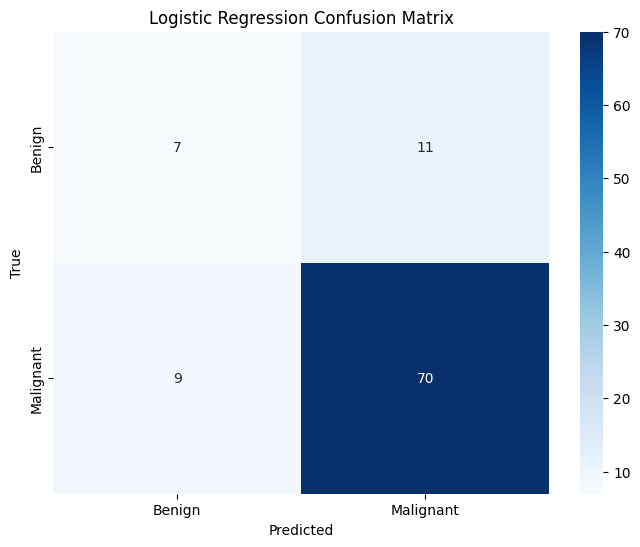

In [75]:
# Logistic Regression
log_reg = LogisticRegression(max_iter=1000)
log_reg.fit(X_train, y_train)
y_pred_log_reg = log_reg.predict(X_test)
log_reg_accuracy = accuracy_score(y_test, y_pred_log_reg)
log_reg_report = classification_report(y_test, y_pred_log_reg, output_dict=True)
log_reg_cm = confusion_matrix(y_test, y_pred_log_reg)

print("Logistic Regression Accuracy:", log_reg_accuracy)
print("Logistic Regression Classification Report:\n", classification_report(y_test, y_pred_log_reg))
plt.figure(figsize=(8, 6))
sns.heatmap(log_reg_cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Benign', 'Malignant'], yticklabels=['Benign', 'Malignant'])
plt.title('Logistic Regression Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

MLP Accuracy: 0.8350515463917526
MLP Classification Report:
               precision    recall  f1-score   support

           0       0.56      0.50      0.53        18
           1       0.89      0.91      0.90        79

    accuracy                           0.84        97
   macro avg       0.73      0.71      0.71        97
weighted avg       0.83      0.84      0.83        97



Text(0.5, 36.72222222222221, 'Predicted')

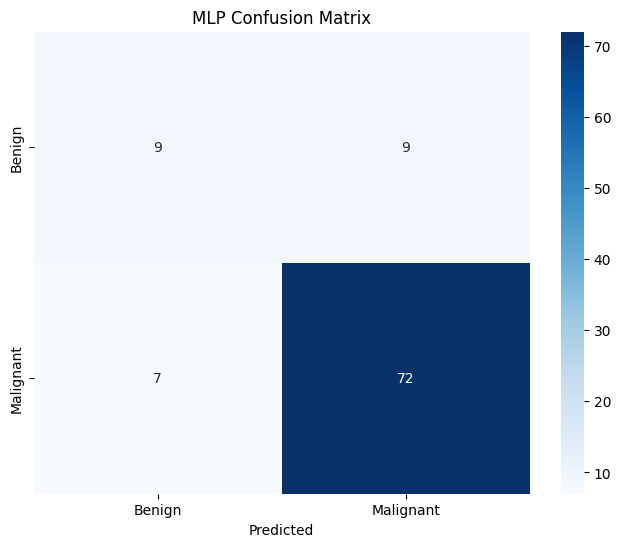

In [84]:
# MLP, my best friend
mlp = MLPClassifier(max_iter=1000, random_state=42, hidden_layer_sizes=(100, 50, 50, 50, 50), activation='relu', solver='adam')
mlp.fit(X_train, y_train)
y_pred_mlp = mlp.predict(X_test)
mlp_accuracy = accuracy_score(y_test, y_pred_mlp)
mlp_report = classification_report(y_test, y_pred_mlp, output_dict=True)
mlp_cm = confusion_matrix(y_test, y_pred_mlp)

print("MLP Accuracy:", mlp_accuracy)
print("MLP Classification Report:\n", classification_report(y_test, y_pred_mlp))
plt.figure(figsize=(8, 6))
sns.heatmap(mlp_cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Benign', 'Malignant'], yticklabels=['Benign', 'Malignant'])
plt.title('MLP Confusion Matrix')
plt.xlabel('Predicted')


Decision Tree Accuracy: 0.7216494845360825
Decision Tree Classification Report:
               precision    recall  f1-score   support

           0       0.30      0.39      0.34        18
           1       0.85      0.80      0.82        79

    accuracy                           0.72        97
   macro avg       0.58      0.59      0.58        97
weighted avg       0.75      0.72      0.73        97



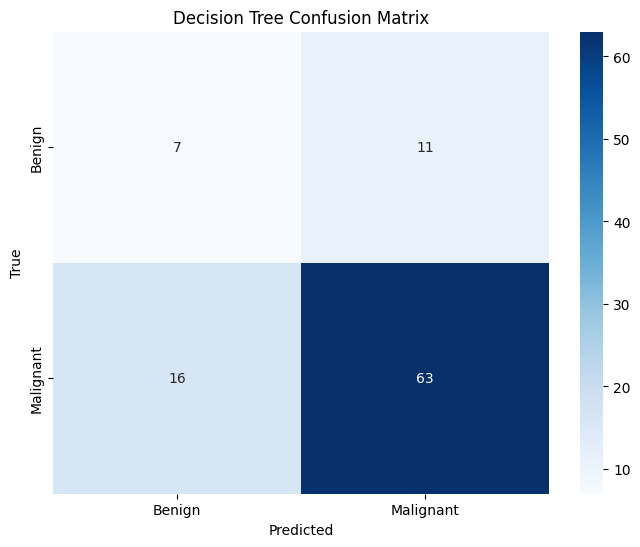

In [85]:
# Decision Tree
dt = DecisionTreeClassifier(random_state=42)
dt.fit(X_train, y_train)
y_pred_dt = dt.predict(X_test)
dt_accuracy = accuracy_score(y_test, y_pred_dt)
dt_report = classification_report(y_test, y_pred_dt, output_dict=True)

dt_cm = confusion_matrix(y_test, y_pred_dt)
print("Decision Tree Accuracy:", dt_accuracy)
print("Decision Tree Classification Report:\n", classification_report(y_test, y_pred_dt))
plt.figure(figsize=(8, 6))
sns.heatmap(dt_cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Benign', 'Malignant'], yticklabels=['Benign', 'Malignant'])
plt.title('Decision Tree Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()


Random Forest Accuracy: 0.845360824742268
Random Forest Classification Report:
               precision    recall  f1-score   support

           0       0.67      0.33      0.44        18
           1       0.86      0.96      0.91        79

    accuracy                           0.85        97
   macro avg       0.77      0.65      0.68        97
weighted avg       0.83      0.85      0.82        97



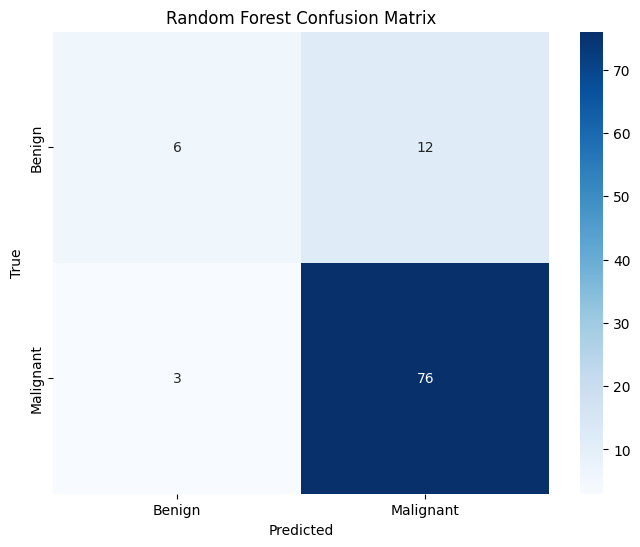

In [86]:
# Random Forest
rf = RandomForestClassifier(random_state=42)
rf.fit(X_train, y_train)
y_pred_rf = rf.predict(X_test)
rf_accuracy = accuracy_score(y_test, y_pred_rf)
rf_report = classification_report(y_test, y_pred_rf, output_dict=True)
rf_cm = confusion_matrix(y_test, y_pred_rf)
print("Random Forest Accuracy:", rf_accuracy)
print("Random Forest Classification Report:\n", classification_report(y_test, y_pred_rf))
plt.figure(figsize=(8, 6))
sns.heatmap(rf_cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Benign', 'Malignant'], yticklabels=['Benign', 'Malignant'])
plt.title('Random Forest Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()


KNN Accuracy: 0.7731958762886598
KNN Classification Report:
               precision    recall  f1-score   support

           0       0.36      0.28      0.31        18
           1       0.84      0.89      0.86        79

    accuracy                           0.77        97
   macro avg       0.60      0.58      0.59        97
weighted avg       0.75      0.77      0.76        97



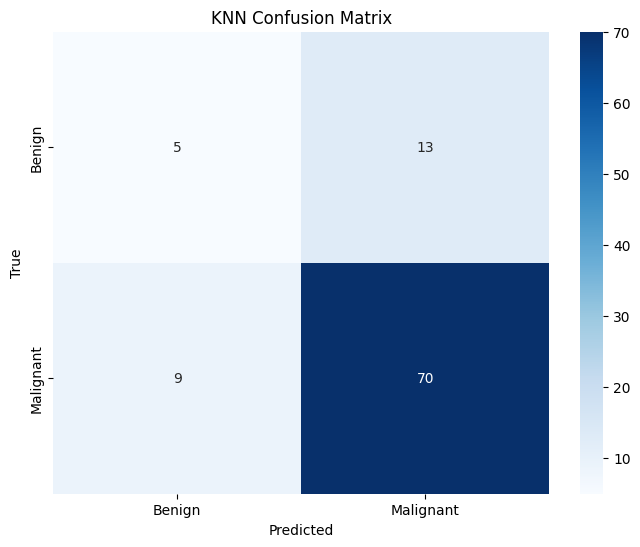

In [88]:
# K-Nearest Neighbors (KNN)
knn = KNeighborsClassifier()
knn.fit(X_train, y_train)
y_pred_knn = knn.predict(X_test)
knn_accuracy = accuracy_score(y_test, y_pred_knn)
knn_report = classification_report(y_test, y_pred_knn, output_dict=True)
knn_cm = confusion_matrix(y_test, y_pred_knn)
print("KNN Accuracy:", knn_accuracy)
print("KNN Classification Report:\n", classification_report(y_test, y_pred_knn))
plt.figure(figsize=(8, 6))
sns.heatmap(knn_cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Benign', 'Malignant'], yticklabels=['Benign', 'Malignant'])
plt.title('KNN Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()


C:\Users\ago19\AppData\Local\Temp\ipykernel_10368\985650997.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Model', y='Accuracy', data=results_df, palette='viridis')


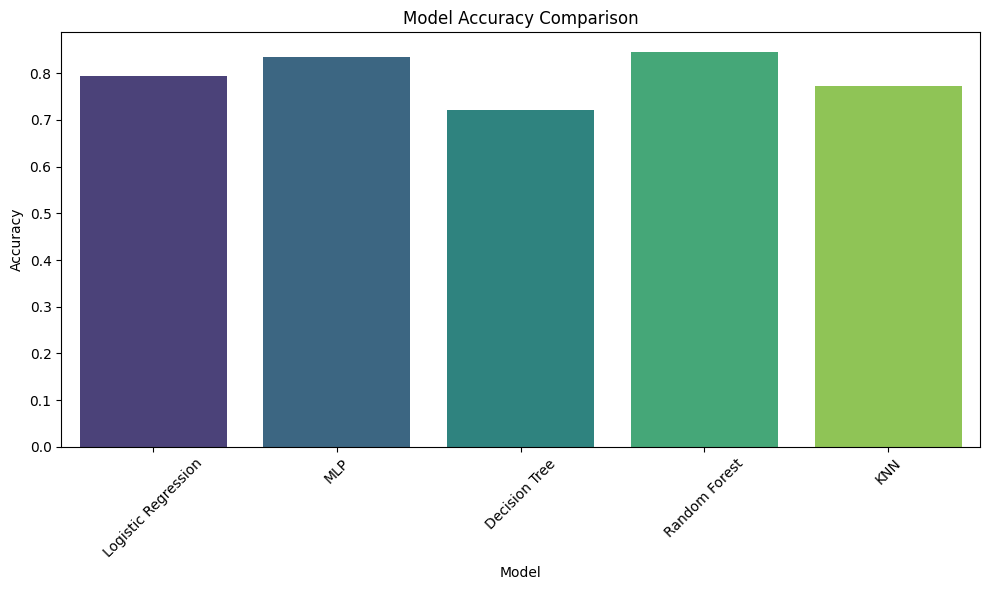

In [91]:
# Resume all results in graphs

results = {
    'Logistic Regression': log_reg_accuracy,
    'MLP': mlp_accuracy,
    'Decision Tree': dt_accuracy,
    'Random Forest': rf_accuracy,
    'KNN': knn_accuracy
}
results_df = pd.DataFrame(list(results.items()), columns=['Model', 'Accuracy'])
plt.figure(figsize=(10, 6))
sns.barplot(x='Model', y='Accuracy', data=results_df, palette='viridis')
plt.title('Model Accuracy Comparison')
plt.xlabel('Model')
plt.ylabel('Accuracy')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()